In [5]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
data={'Size_sqft':[1000,1500,1200,1800,1100],
      'Price_k':[300,450,360,540,330]
     }
df=pd.DataFrame(data)
# Define features and target
X = df[['Size_sqft']] # Feature(s)
y = df['Price_k']    # Target 

#Split into train/test sets
X_train, X_test, y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Train model
model = LinearRegression()
model.fit(X_train,y_train)

#Inspect model
slope_m=model.coef_[0]
intercept_b = model.intercept_
print(f"Learned Slope (m): {slope_m:2f}")

#Predict and evaluate
y_pred = model.predict(X_test)
r_sq = model.score(X_test, y_test)
print(f"R-squared score on Test Set:{r_sq:.4f}")

#Predict for a new house size
new_house_size = np.array([[1300]])
predicted_price = model.predict(new_house_size)
print(f"Predicted Price for 1300 sqft: ${predicted_price[0]:.2f}k")

Learned Slope (m): 0.300000
R-squared score on Test Set:nan
Predicted Price for 1300 sqft: $390.00k


C:\Users\nirma\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\nirma\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [4]:
#simple LinearRegression


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error,mean_squared_error, r2_score
df = pd.read_csv("crop-yield.csv")
import os
print(os.getcwd())
print(df.head())

C:\Users\nirma
     N   P    K  Soil_pH  Soil_Moisture Soil_Type  Organic_Carbon  \
0  132  62   22     6.35          59.78      Clay            0.43   
1  122  71   66     5.98          25.54     Sandy            0.65   
2   44  35  104     8.07          25.87     Sandy            0.79   
3  136  96  113     4.83          42.97      Silt            0.45   
4  101  34   42     5.84          48.01      Silt            0.69   

   Temperature  Humidity  Rainfall  Sunlight_Hours  Wind_Speed   Region  \
0        22.97     53.89   1305.68            7.73       15.96  Central   
1        17.00     76.90   1942.05            9.25       12.60    North   
2        25.52     44.78   2216.20            8.50       15.63    North   
3        18.59     31.89    607.18            8.75        5.49     East   
4        22.74     46.27    483.47            8.00        7.44  Central   

   Altitude  Season  Crop_Type Irrigation_Type  Fertilizer_Used  \
0        36    Rabi      Maize           Canal      

In [5]:
print(df.shape)

(10000, 20)


In [8]:
print(df.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 20 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   N                           10000 non-null  int64  
 1   P                           10000 non-null  int64  
 2   K                           10000 non-null  int64  
 3   Soil_pH                     10000 non-null  float64
 4   Soil_Moisture               10000 non-null  float64
 5   Soil_Type                   10000 non-null  object 
 6   Organic_Carbon              10000 non-null  float64
 7   Temperature                 10000 non-null  float64
 8   Humidity                    10000 non-null  float64
 9   Rainfall                    10000 non-null  float64
 10  Sunlight_Hours              10000 non-null  float64
 11  Wind_Speed                  10000 non-null  float64
 12  Region                      10000 non-null  object 
 13  Altitude                    1000

In [9]:
print(df.describe())

                  N             P             K       Soil_pH  Soil_Moisture  \
count  10000.000000  10000.000000  10000.000000  10000.000000   10000.000000   
mean     104.983000     56.809600     85.008700      6.504306      40.083748   
std       43.291654     24.522962     37.541443      0.978698      14.461944   
min       30.000000     15.000000     20.000000      4.800000      15.000000   
25%       68.000000     35.000000     52.000000      5.670000      27.630000   
50%      105.000000     57.000000     85.000000      6.520000      40.000000   
75%      142.000000     78.000000    118.000000      7.350000      52.762500   
max      179.000000     99.000000    149.000000      8.200000      64.990000   

       Organic_Carbon   Temperature      Humidity      Rainfall  \
count    10000.000000  10000.000000  10000.000000  10000.000000   
mean         0.958356     25.097402     59.894209   1546.694887   
std          0.375027      8.719031     17.402450    718.865960   
min        

In [11]:
print(df.isnull())

          N      P      K  Soil_pH  Soil_Moisture  Soil_Type  Organic_Carbon  \
0     False  False  False    False          False      False           False   
1     False  False  False    False          False      False           False   
2     False  False  False    False          False      False           False   
3     False  False  False    False          False      False           False   
4     False  False  False    False          False      False           False   
...     ...    ...    ...      ...            ...        ...             ...   
9995  False  False  False    False          False      False           False   
9996  False  False  False    False          False      False           False   
9997  False  False  False    False          False      False           False   
9998  False  False  False    False          False      False           False   
9999  False  False  False    False          False      False           False   

      Temperature  Humidity  Rainfall  

In [12]:
df.fillna(df.mean(numeric_only=True),inplace=True)

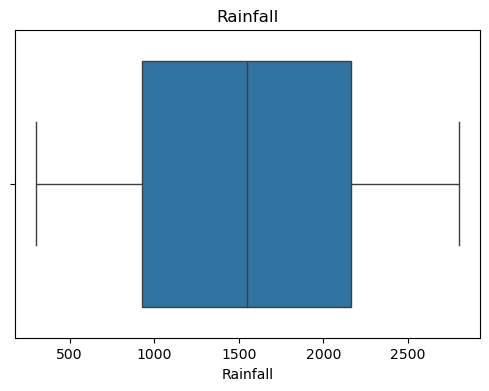

In [17]:
plt.figure(figsize=(6,4))
sns.boxplot(x=df["Rainfall"])
plt.title("Rainfall")
plt.show()

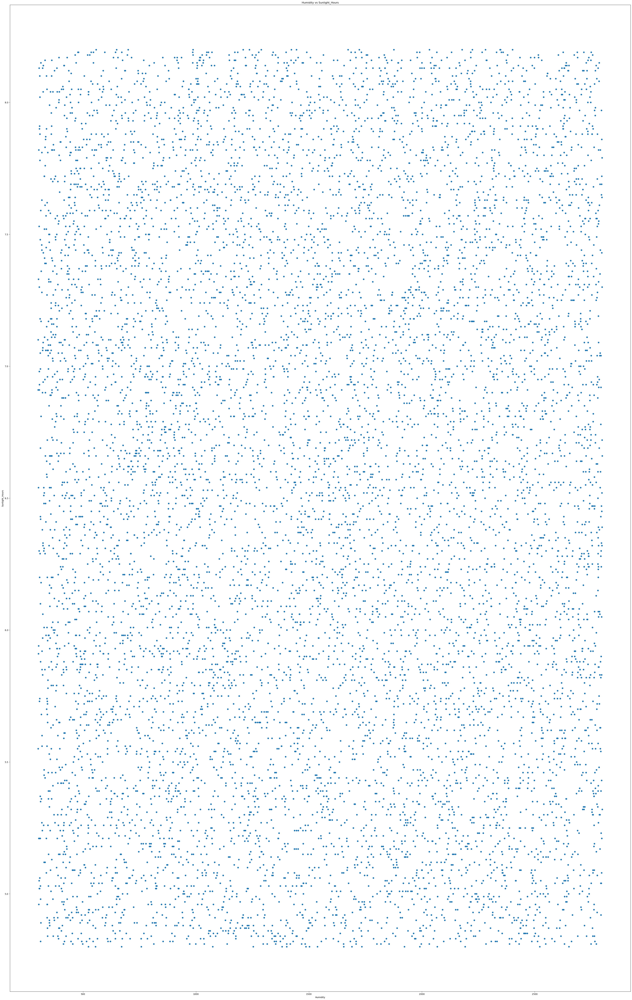

In [25]:
plt.figure(figsize=(50,80))
plt.scatter(df["Rainfall"],df["Soil_pH"])
plt.xlabel("Humidity")
plt.ylabel("Sunlight_Hours")
plt.title("Humidity vs Sunlight_Hours")
plt.show()

In [26]:
df1=df.head(15)

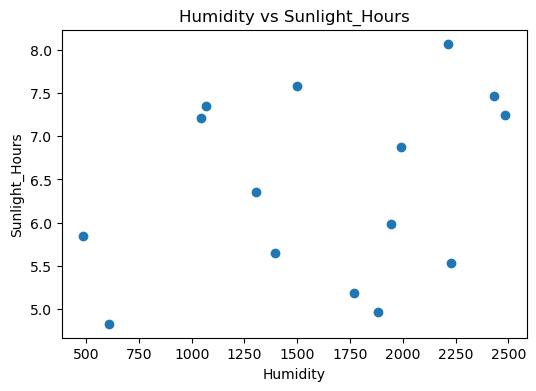

In [29]:
plt.figure(figsize=(6,4))
plt.scatter(df1["Rainfall"],df1["Soil_pH"])
plt.xlabel("Humidity")
plt.ylabel("Sunlight_Hours")
plt.title("Humidity vs Sunlight_Hours")
plt.show()

In [36]:
plt.figure(figsize=())
sns.heatmap(df1.corr(),annot=True,cmap="coolwarm")
plt.title("Correlation Heatmap")
plt,show()

ValueError: could not convert string to float: 'Clay'

<Figure size 600x400 with 0 Axes>

In [43]:
df1=df.drop("Soil_Type",axis=1)

In [44]:
df1

,N,P,K,Soil_pH,Soil_Moisture,Organic_Carbon,Temperature,Humidity,Rainfall,Sunlight_Hours,Wind_Speed,Region,Altitude,Season,Crop_Type,Irrigation_Type,Fertilizer_Used,Pesticide_Used,Crop_Yield_ton_per_hectare
0,132,62,22,6.35,59.78,0.43,22.97,53.89,1305.68,7.73,15.96,Central,36,Rabi,Maize,Canal,223.48,23.36,11.42
1,122,71,66,5.98,25.54,0.65,17.00,76.90,1942.05,9.25,12.60,North,1561,Rabi,Potato,Canal,161.54,4.42,23.19
2,44,35,104,8.07,25.87,0.79,25.52,44.78,2216.20,8.50,15.63,North,1870,Rabi,Rice,Rainfed,184.62,6.29,7.94
3,136,96,113,4.83,42.97,0.45,18.59,31.89,607.18,8.75,5.49,East,765,Kharif,Sugarcane,Rainfed,274.02,2.72,72.53
4,101,34,42,5.84,48.01,0.69,22.74,46.27,483.47,8.00,7.44,Central,1143,Zaid,Wheat,Rainfed,72.69,15.37,6.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,80,21,64,7.22,34.04,0.85,35.20,78.31,850.20,10.26,2.20,East,1630,Rabi,Wheat,Rainfed,191.11,12.02,8.87
9996,168,36,36,6.45,56.84,0.66,37.19,38.78,2490.54,7.87,7.06,East,1665,Zaid,Sugarcane,Canal,238.87,21.86,77.29
9997,100,99,24,7.18,18.13,0.54,11.36,56.64,1965.34,10.06,12.42,Central,591,Zaid,Sugarcane,Drip,312.73,18.79,73.57
9998,68,20,63,6.32,53.47,0.68,35.95,57.94,497.37,10.18,6.28,North,1900,Kharif,Sugarcane,Rainfed,227.50,10.58,74.22


In [42]:
df

,N,P,K,Soil_pH,Soil_Moisture,Soil_Type,Organic_Carbon,Temperature,Humidity,Rainfall,Sunlight_Hours,Wind_Speed,Region,Altitude,Season,Crop_Type,Irrigation_Type,Fertilizer_Used,Pesticide_Used,Crop_Yield_ton_per_hectare
0,132,62,22,6.35,59.78,Clay,0.43,22.97,53.89,1305.68,7.73,15.96,Central,36,Rabi,Maize,Canal,223.48,23.36,11.42
1,122,71,66,5.98,25.54,Sandy,0.65,17.00,76.90,1942.05,9.25,12.60,North,1561,Rabi,Potato,Canal,161.54,4.42,23.19
2,44,35,104,8.07,25.87,Sandy,0.79,25.52,44.78,2216.20,8.50,15.63,North,1870,Rabi,Rice,Rainfed,184.62,6.29,7.94
3,136,96,113,4.83,42.97,Silt,0.45,18.59,31.89,607.18,8.75,5.49,East,765,Kharif,Sugarcane,Rainfed,274.02,2.72,72.53
4,101,34,42,5.84,48.01,Silt,0.69,22.74,46.27,483.47,8.00,7.44,Central,1143,Zaid,Wheat,Rainfed,72.69,15.37,6.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,80,21,64,7.22,34.04,Loamy,0.85,35.20,78.31,850.20,10.26,2.20,East,1630,Rabi,Wheat,Rainfed,191.11,12.02,8.87
9996,168,36,36,6.45,56.84,Loamy,0.66,37.19,38.78,2490.54,7.87,7.06,East,1665,Zaid,Sugarcane,Canal,238.87,21.86,77.29
9997,100,99,24,7.18,18.13,Sandy,0.54,11.36,56.64,1965.34,10.06,12.42,Central,591,Zaid,Sugarcane,Drip,312.73,18.79,73.57
9998,68,20,63,6.32,53.47,Loamy,0.68,35.95,57.94,497.37,10.18,6.28,North,1900,Kharif,Sugarcane,Rainfed,227.50,10.58,74.22


In [45]:
df1

,N,P,K,Soil_pH,Soil_Moisture,Organic_Carbon,Temperature,Humidity,Rainfall,Sunlight_Hours,Wind_Speed,Region,Altitude,Season,Crop_Type,Irrigation_Type,Fertilizer_Used,Pesticide_Used,Crop_Yield_ton_per_hectare
0,132,62,22,6.35,59.78,0.43,22.97,53.89,1305.68,7.73,15.96,Central,36,Rabi,Maize,Canal,223.48,23.36,11.42
1,122,71,66,5.98,25.54,0.65,17.00,76.90,1942.05,9.25,12.60,North,1561,Rabi,Potato,Canal,161.54,4.42,23.19
2,44,35,104,8.07,25.87,0.79,25.52,44.78,2216.20,8.50,15.63,North,1870,Rabi,Rice,Rainfed,184.62,6.29,7.94
3,136,96,113,4.83,42.97,0.45,18.59,31.89,607.18,8.75,5.49,East,765,Kharif,Sugarcane,Rainfed,274.02,2.72,72.53
4,101,34,42,5.84,48.01,0.69,22.74,46.27,483.47,8.00,7.44,Central,1143,Zaid,Wheat,Rainfed,72.69,15.37,6.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,80,21,64,7.22,34.04,0.85,35.20,78.31,850.20,10.26,2.20,East,1630,Rabi,Wheat,Rainfed,191.11,12.02,8.87
9996,168,36,36,6.45,56.84,0.66,37.19,38.78,2490.54,7.87,7.06,East,1665,Zaid,Sugarcane,Canal,238.87,21.86,77.29
9997,100,99,24,7.18,18.13,0.54,11.36,56.64,1965.34,10.06,12.42,Central,591,Zaid,Sugarcane,Drip,312.73,18.79,73.57
9998,68,20,63,6.32,53.47,0.68,35.95,57.94,497.37,10.18,6.28,North,1900,Kharif,Sugarcane,Rainfed,227.50,10.58,74.22


In [56]:
df1=df.drop("Region",axis=1)
df1=df.drop("Season",axis=1)
df1=df.drop("Crop_Type",axis=1)
df1=df.drop("Irrigation_Type",axis=1)

In [57]:
df1

,N,P,K,Soil_pH,Soil_Moisture,Soil_Type,Organic_Carbon,Temperature,Humidity,Rainfall,Sunlight_Hours,Wind_Speed,Region,Altitude,Season,Crop_Type,Fertilizer_Used,Pesticide_Used,Crop_Yield_ton_per_hectare
0,132,62,22,6.35,59.78,Clay,0.43,22.97,53.89,1305.68,7.73,15.96,Central,36,Rabi,Maize,223.48,23.36,11.42
1,122,71,66,5.98,25.54,Sandy,0.65,17.00,76.90,1942.05,9.25,12.60,North,1561,Rabi,Potato,161.54,4.42,23.19
2,44,35,104,8.07,25.87,Sandy,0.79,25.52,44.78,2216.20,8.50,15.63,North,1870,Rabi,Rice,184.62,6.29,7.94
3,136,96,113,4.83,42.97,Silt,0.45,18.59,31.89,607.18,8.75,5.49,East,765,Kharif,Sugarcane,274.02,2.72,72.53
4,101,34,42,5.84,48.01,Silt,0.69,22.74,46.27,483.47,8.00,7.44,Central,1143,Zaid,Wheat,72.69,15.37,6.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,80,21,64,7.22,34.04,Loamy,0.85,35.20,78.31,850.20,10.26,2.20,East,1630,Rabi,Wheat,191.11,12.02,8.87
9996,168,36,36,6.45,56.84,Loamy,0.66,37.19,38.78,2490.54,7.87,7.06,East,1665,Zaid,Sugarcane,238.87,21.86,77.29
9997,100,99,24,7.18,18.13,Sandy,0.54,11.36,56.64,1965.34,10.06,12.42,Central,591,Zaid,Sugarcane,312.73,18.79,73.57
9998,68,20,63,6.32,53.47,Loamy,0.68,35.95,57.94,497.37,10.18,6.28,North,1900,Kharif,Sugarcane,227.50,10.58,74.22


In [63]:
df1=df.drop("Region",axis=1,inplace=True)

In [66]:
df

,N,P,K,Soil_pH,Soil_Moisture,Soil_Type,Organic_Carbon,Temperature,Humidity,Rainfall,Sunlight_Hours,Wind_Speed,Altitude,Season,Crop_Type,Irrigation_Type,Fertilizer_Used,Pesticide_Used,Crop_Yield_ton_per_hectare
0,132,62,22,6.35,59.78,Clay,0.43,22.97,53.89,1305.68,7.73,15.96,36,Rabi,Maize,Canal,223.48,23.36,11.42
1,122,71,66,5.98,25.54,Sandy,0.65,17.00,76.90,1942.05,9.25,12.60,1561,Rabi,Potato,Canal,161.54,4.42,23.19
2,44,35,104,8.07,25.87,Sandy,0.79,25.52,44.78,2216.20,8.50,15.63,1870,Rabi,Rice,Rainfed,184.62,6.29,7.94
3,136,96,113,4.83,42.97,Silt,0.45,18.59,31.89,607.18,8.75,5.49,765,Kharif,Sugarcane,Rainfed,274.02,2.72,72.53
4,101,34,42,5.84,48.01,Silt,0.69,22.74,46.27,483.47,8.00,7.44,1143,Zaid,Wheat,Rainfed,72.69,15.37,6.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,80,21,64,7.22,34.04,Loamy,0.85,35.20,78.31,850.20,10.26,2.20,1630,Rabi,Wheat,Rainfed,191.11,12.02,8.87
9996,168,36,36,6.45,56.84,Loamy,0.66,37.19,38.78,2490.54,7.87,7.06,1665,Zaid,Sugarcane,Canal,238.87,21.86,77.29
9997,100,99,24,7.18,18.13,Sandy,0.54,11.36,56.64,1965.34,10.06,12.42,591,Zaid,Sugarcane,Drip,312.73,18.79,73.57
9998,68,20,63,6.32,53.47,Loamy,0.68,35.95,57.94,497.37,10.18,6.28,1900,Kharif,Sugarcane,Rainfed,227.50,10.58,74.22


In [67]:
df1

In [68]:
df.drop("Season",axis=1,inplace=True)

In [70]:
df

,N,P,K,Soil_pH,Soil_Moisture,Soil_Type,Organic_Carbon,Temperature,Humidity,Rainfall,Sunlight_Hours,Wind_Speed,Altitude,Crop_Type,Irrigation_Type,Fertilizer_Used,Pesticide_Used,Crop_Yield_ton_per_hectare
0,132,62,22,6.35,59.78,Clay,0.43,22.97,53.89,1305.68,7.73,15.96,36,Maize,Canal,223.48,23.36,11.42
1,122,71,66,5.98,25.54,Sandy,0.65,17.00,76.90,1942.05,9.25,12.60,1561,Potato,Canal,161.54,4.42,23.19
2,44,35,104,8.07,25.87,Sandy,0.79,25.52,44.78,2216.20,8.50,15.63,1870,Rice,Rainfed,184.62,6.29,7.94
3,136,96,113,4.83,42.97,Silt,0.45,18.59,31.89,607.18,8.75,5.49,765,Sugarcane,Rainfed,274.02,2.72,72.53
4,101,34,42,5.84,48.01,Silt,0.69,22.74,46.27,483.47,8.00,7.44,1143,Wheat,Rainfed,72.69,15.37,6.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,80,21,64,7.22,34.04,Loamy,0.85,35.20,78.31,850.20,10.26,2.20,1630,Wheat,Rainfed,191.11,12.02,8.87
9996,168,36,36,6.45,56.84,Loamy,0.66,37.19,38.78,2490.54,7.87,7.06,1665,Sugarcane,Canal,238.87,21.86,77.29
9997,100,99,24,7.18,18.13,Sandy,0.54,11.36,56.64,1965.34,10.06,12.42,591,Sugarcane,Drip,312.73,18.79,73.57
9998,68,20,63,6.32,53.47,Loamy,0.68,35.95,57.94,497.37,10.18,6.28,1900,Sugarcane,Rainfed,227.50,10.58,74.22


In [71]:
df.drop("Crop_Type",axis=1,inplace=True)

In [72]:
df

,N,P,K,Soil_pH,Soil_Moisture,Soil_Type,Organic_Carbon,Temperature,Humidity,Rainfall,Sunlight_Hours,Wind_Speed,Altitude,Irrigation_Type,Fertilizer_Used,Pesticide_Used,Crop_Yield_ton_per_hectare
0,132,62,22,6.35,59.78,Clay,0.43,22.97,53.89,1305.68,7.73,15.96,36,Canal,223.48,23.36,11.42
1,122,71,66,5.98,25.54,Sandy,0.65,17.00,76.90,1942.05,9.25,12.60,1561,Canal,161.54,4.42,23.19
2,44,35,104,8.07,25.87,Sandy,0.79,25.52,44.78,2216.20,8.50,15.63,1870,Rainfed,184.62,6.29,7.94
3,136,96,113,4.83,42.97,Silt,0.45,18.59,31.89,607.18,8.75,5.49,765,Rainfed,274.02,2.72,72.53
4,101,34,42,5.84,48.01,Silt,0.69,22.74,46.27,483.47,8.00,7.44,1143,Rainfed,72.69,15.37,6.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,80,21,64,7.22,34.04,Loamy,0.85,35.20,78.31,850.20,10.26,2.20,1630,Rainfed,191.11,12.02,8.87
9996,168,36,36,6.45,56.84,Loamy,0.66,37.19,38.78,2490.54,7.87,7.06,1665,Canal,238.87,21.86,77.29
9997,100,99,24,7.18,18.13,Sandy,0.54,11.36,56.64,1965.34,10.06,12.42,591,Drip,312.73,18.79,73.57
9998,68,20,63,6.32,53.47,Loamy,0.68,35.95,57.94,497.37,10.18,6.28,1900,Rainfed,227.50,10.58,74.22


In [74]:
df.drop("Irrigation_Type",axis=1,inplace=True)

In [75]:
df

,N,P,K,Soil_pH,Soil_Moisture,Soil_Type,Organic_Carbon,Temperature,Humidity,Rainfall,Sunlight_Hours,Wind_Speed,Altitude,Fertilizer_Used,Pesticide_Used,Crop_Yield_ton_per_hectare
0,132,62,22,6.35,59.78,Clay,0.43,22.97,53.89,1305.68,7.73,15.96,36,223.48,23.36,11.42
1,122,71,66,5.98,25.54,Sandy,0.65,17.00,76.90,1942.05,9.25,12.60,1561,161.54,4.42,23.19
2,44,35,104,8.07,25.87,Sandy,0.79,25.52,44.78,2216.20,8.50,15.63,1870,184.62,6.29,7.94
3,136,96,113,4.83,42.97,Silt,0.45,18.59,31.89,607.18,8.75,5.49,765,274.02,2.72,72.53
4,101,34,42,5.84,48.01,Silt,0.69,22.74,46.27,483.47,8.00,7.44,1143,72.69,15.37,6.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,80,21,64,7.22,34.04,Loamy,0.85,35.20,78.31,850.20,10.26,2.20,1630,191.11,12.02,8.87
9996,168,36,36,6.45,56.84,Loamy,0.66,37.19,38.78,2490.54,7.87,7.06,1665,238.87,21.86,77.29
9997,100,99,24,7.18,18.13,Sandy,0.54,11.36,56.64,1965.34,10.06,12.42,591,312.73,18.79,73.57
9998,68,20,63,6.32,53.47,Loamy,0.68,35.95,57.94,497.37,10.18,6.28,1900,227.50,10.58,74.22


In [77]:
df.drop("Soil_Type",axis=1,inplace=True)

In [78]:
df

,N,P,K,Soil_pH,Soil_Moisture,Organic_Carbon,Temperature,Humidity,Rainfall,Sunlight_Hours,Wind_Speed,Altitude,Fertilizer_Used,Pesticide_Used,Crop_Yield_ton_per_hectare
0,132,62,22,6.35,59.78,0.43,22.97,53.89,1305.68,7.73,15.96,36,223.48,23.36,11.42
1,122,71,66,5.98,25.54,0.65,17.00,76.90,1942.05,9.25,12.60,1561,161.54,4.42,23.19
2,44,35,104,8.07,25.87,0.79,25.52,44.78,2216.20,8.50,15.63,1870,184.62,6.29,7.94
3,136,96,113,4.83,42.97,0.45,18.59,31.89,607.18,8.75,5.49,765,274.02,2.72,72.53
4,101,34,42,5.84,48.01,0.69,22.74,46.27,483.47,8.00,7.44,1143,72.69,15.37,6.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,80,21,64,7.22,34.04,0.85,35.20,78.31,850.20,10.26,2.20,1630,191.11,12.02,8.87
9996,168,36,36,6.45,56.84,0.66,37.19,38.78,2490.54,7.87,7.06,1665,238.87,21.86,77.29
9997,100,99,24,7.18,18.13,0.54,11.36,56.64,1965.34,10.06,12.42,591,312.73,18.79,73.57
9998,68,20,63,6.32,53.47,0.68,35.95,57.94,497.37,10.18,6.28,1900,227.50,10.58,74.22


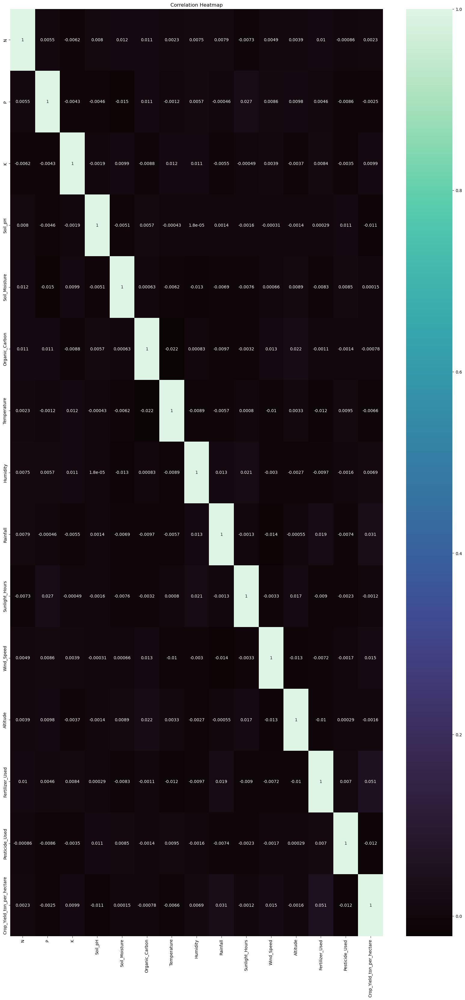

In [85]:
plt.figure(figsize=(20,40))
sns.heatmap(df.corr(),annot=True,cmap="mako")
plt.title("Correlation Heatmap")
plt.show()

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error,mean_squared_error, r2_score
df = pd.read_csv("crop-yield.csv")
import os
print(os.getcwd())
print(df.head())

C:\Users\nirma
     N   P    K  Soil_pH  Soil_Moisture Soil_Type  Organic_Carbon  \
0  132  62   22     6.35          59.78      Clay            0.43   
1  122  71   66     5.98          25.54     Sandy            0.65   
2   44  35  104     8.07          25.87     Sandy            0.79   
3  136  96  113     4.83          42.97      Silt            0.45   
4  101  34   42     5.84          48.01      Silt            0.69   

   Temperature  Humidity  Rainfall  Sunlight_Hours  Wind_Speed   Region  \
0        22.97     53.89   1305.68            7.73       15.96  Central   
1        17.00     76.90   1942.05            9.25       12.60    North   
2        25.52     44.78   2216.20            8.50       15.63    North   
3        18.59     31.89    607.18            8.75        5.49     East   
4        22.74     46.27    483.47            8.00        7.44  Central   

   Altitude  Season  Crop_Type Irrigation_Type  Fertilizer_Used  \
0        36    Rabi      Maize           Canal      

In [14]:
X=df[["Soil_pH"]]
y=df["Soil_Moisture"]
X

,Soil_pH
0,6.35
1,5.98
2,8.07
3,4.83
4,5.84
...,...
9995,7.22
9996,6.45
9997,7.18
9998,6.32


In [15]:
y

0       59.78
1       25.54
2       25.87
3       42.97
4       48.01
        ...  
9995    34.04
9996    56.84
9997    18.13
9998    53.47
9999    19.19
Name: Soil_Moisture, Length: 10000, dtype: float64

In [17]:
X_train, X_test, y_train,y_test = train_test_split(
    X,y, test_size=0.2,random_state=42
)

In [18]:
model = LinearRegression()
model.fit(X_train, y_train)
print("\nModel Coefficient (m):", model.coef_[0])
print("Model Intercept (c):",model.intercept_)


Model Coefficient (m): -0.1394653703810073
Model Intercept (c): 40.93441410255394


In [20]:
y_pred = model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
print("\n--- Model Evaluation ---")
print(f"Mean Absolute Error (MAE):{mae}")
print(f"Mean Squared Error (MSE):{mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R^2 Score: {r2}")


--- Model Evaluation ---
Mean Absolute Error (MAE):12.454014897184065
Mean Squared Error (MSE):208.2295073421582
Root Mean Squared Error (RMSE): 14.430159643682332
R^2 Score: -0.0007057318496788145


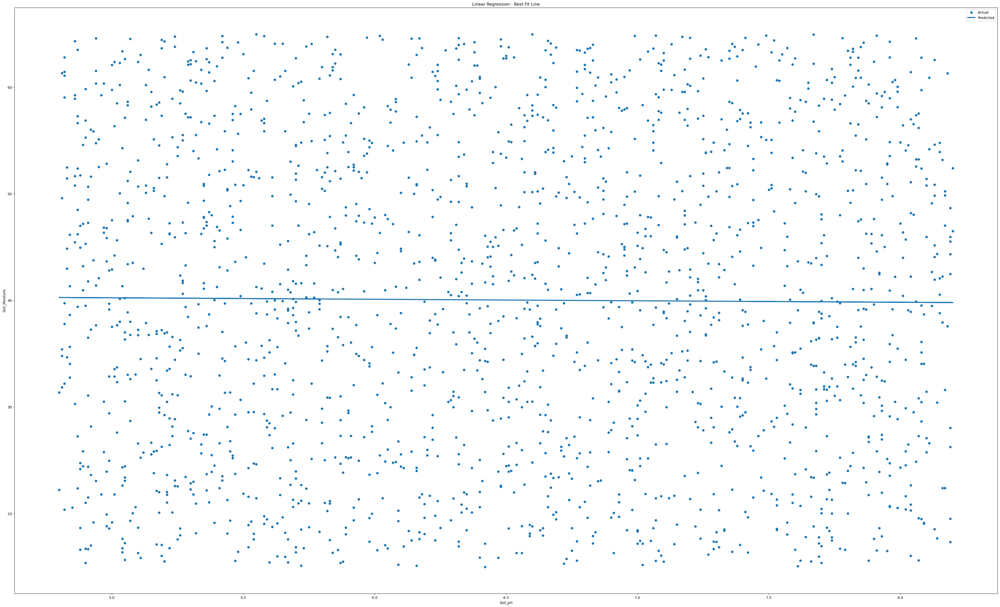

In [26]:
plt.figure(figsize=(50,30))
plt.scatter(X_test, y_test, label="Actual")
plt.plot(X_test, y_pred, label="Predicted", linewidth=3)
plt.xlabel("Soil_pH")
plt.ylabel("Soil_Moisture")
plt.title("Linear Regression - Best Fit Line")
plt.legend()
plt.show()

In [27]:
# MultipleLinearRegession


In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error,mean_squared_error, r2_score
df = pd.read_csv("crop-yield.csv")
df.head()

,N,P,K,Soil_pH,Soil_Moisture,Soil_Type,Organic_Carbon,Temperature,Humidity,Rainfall,Sunlight_Hours,Wind_Speed,Region,Altitude,Season,Crop_Type,Irrigation_Type,Fertilizer_Used,Pesticide_Used,Crop_Yield_ton_per_hectare
0,132,62,22,6.35,59.78,Clay,0.43,22.97,53.89,1305.68,7.73,15.96,Central,36,Rabi,Maize,Canal,223.48,23.36,11.42
1,122,71,66,5.98,25.54,Sandy,0.65,17.00,76.90,1942.05,9.25,12.60,North,1561,Rabi,Potato,Canal,161.54,4.42,23.19
2,44,35,104,8.07,25.87,Sandy,0.79,25.52,44.78,2216.20,8.50,15.63,North,1870,Rabi,Rice,Rainfed,184.62,6.29,7.94
3,136,96,113,4.83,42.97,Silt,0.45,18.59,31.89,607.18,8.75,5.49,East,765,Kharif,Sugarcane,Rainfed,274.02,2.72,72.53
4,101,34,42,5.84,48.01,Silt,0.69,22.74,46.27,483.47,8.00,7.44,Central,1143,Zaid,Wheat,Rainfed,72.69,15.37,6.72


In [29]:
print("Shape:",df.shape)

Shape: (10000, 20)


In [30]:
print("Columns:",df.columns)

Columns: Index(['N', 'P', 'K', 'Soil_pH', 'Soil_Moisture', 'Soil_Type',
       'Organic_Carbon', 'Temperature', 'Humidity', 'Rainfall',
       'Sunlight_Hours', 'Wind_Speed', 'Region', 'Altitude', 'Season',
       'Crop_Type', 'Irrigation_Type', 'Fertilizer_Used', 'Pesticide_Used',
       'Crop_Yield_ton_per_hectare'],
      dtype='object')


In [31]:
df.describe()

,N,P,K,Soil_pH,Soil_Moisture,Organic_Carbon,Temperature,Humidity,Rainfall,Sunlight_Hours,Wind_Speed,Altitude,Fertilizer_Used,Pesticide_Used,Crop_Yield_ton_per_hectare
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,104.983000,56.809600,85.008700,6.504306,40.083748,0.958356,25.097402,59.894209,1546.694887,7.507868,9.503192,1103.357200,205.986246,12.525571,22.342801
std,43.291654,24.522962,37.541443,0.978698,14.461944,0.375027,8.719031,17.402450,718.865960,2.006472,4.911870,636.513856,83.607922,7.215035,23.986065
min,30.000000,15.000000,20.000000,4.800000,15.000000,0.300000,10.000000,30.010000,300.700000,4.000000,1.000000,0.000000,60.000000,0.000000,1.760000
25%,68.000000,35.000000,52.000000,5.670000,27.630000,0.630000,17.590000,44.830000,925.767500,5.770000,5.230000,550.000000,133.337500,6.310000,8.280000
50%,105.000000,57.000000,85.000000,6.520000,40.000000,0.960000,24.970000,59.550000,1548.550000,7.530000,9.520000,1106.000000,205.820000,12.440000,10.270000
75%,142.000000,78.000000,118.000000,7.350000,52.762500,1.290000,32.830000,75.037500,2165.452500,9.220000,13.710000,1655.250000,278.090000,18.760000,24.750000
max,179.000000,99.000000,149.000000,8.200000,64.990000,1.600000,40.000000,89.990000,2799.260000,11.000000,18.000000,2199.000000,349.960000,25.000000,80.990000


In [32]:
df.isnull().sum()


N                             0
P                             0
K                             0
Soil_pH                       0
Soil_Moisture                 0
Soil_Type                     0
Organic_Carbon                0
Temperature                   0
Humidity                      0
Rainfall                      0
Sunlight_Hours                0
Wind_Speed                    0
Region                        0
Altitude                      0
Season                        0
Crop_Type                     0
Irrigation_Type               0
Fertilizer_Used               0
Pesticide_Used                0
Crop_Yield_ton_per_hectare    0
dtype: int64

In [33]:
df.drop("Crop_Yield_ton_per_hectare",axis=1, inplace=True)
df

,N,P,K,Soil_pH,Soil_Moisture,Soil_Type,Organic_Carbon,Temperature,Humidity,Rainfall,Sunlight_Hours,Wind_Speed,Region,Altitude,Season,Crop_Type,Irrigation_Type,Fertilizer_Used,Pesticide_Used
0,132,62,22,6.35,59.78,Clay,0.43,22.97,53.89,1305.68,7.73,15.96,Central,36,Rabi,Maize,Canal,223.48,23.36
1,122,71,66,5.98,25.54,Sandy,0.65,17.00,76.90,1942.05,9.25,12.60,North,1561,Rabi,Potato,Canal,161.54,4.42
2,44,35,104,8.07,25.87,Sandy,0.79,25.52,44.78,2216.20,8.50,15.63,North,1870,Rabi,Rice,Rainfed,184.62,6.29
3,136,96,113,4.83,42.97,Silt,0.45,18.59,31.89,607.18,8.75,5.49,East,765,Kharif,Sugarcane,Rainfed,274.02,2.72
4,101,34,42,5.84,48.01,Silt,0.69,22.74,46.27,483.47,8.00,7.44,Central,1143,Zaid,Wheat,Rainfed,72.69,15.37
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,80,21,64,7.22,34.04,Loamy,0.85,35.20,78.31,850.20,10.26,2.20,East,1630,Rabi,Wheat,Rainfed,191.11,12.02
9996,168,36,36,6.45,56.84,Loamy,0.66,37.19,38.78,2490.54,7.87,7.06,East,1665,Zaid,Sugarcane,Canal,238.87,21.86
9997,100,99,24,7.18,18.13,Sandy,0.54,11.36,56.64,1965.34,10.06,12.42,Central,591,Zaid,Sugarcane,Drip,312.73,18.79
9998,68,20,63,6.32,53.47,Loamy,0.68,35.95,57.94,497.37,10.18,6.28,North,1900,Kharif,Sugarcane,Rainfed,227.50,10.58


In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error,mean_squared_error, r2_score
df = pd.read_csv("crop-yield.csv")
df.head()

,N,P,K,Soil_pH,Soil_Moisture,Soil_Type,Organic_Carbon,Temperature,Humidity,Rainfall,Sunlight_Hours,Wind_Speed,Region,Altitude,Season,Crop_Type,Irrigation_Type,Fertilizer_Used,Pesticide_Used,Crop_Yield_ton_per_hectare
0,132,62,22,6.35,59.78,Clay,0.43,22.97,53.89,1305.68,7.73,15.96,Central,36,Rabi,Maize,Canal,223.48,23.36,11.42
1,122,71,66,5.98,25.54,Sandy,0.65,17.00,76.90,1942.05,9.25,12.60,North,1561,Rabi,Potato,Canal,161.54,4.42,23.19
2,44,35,104,8.07,25.87,Sandy,0.79,25.52,44.78,2216.20,8.50,15.63,North,1870,Rabi,Rice,Rainfed,184.62,6.29,7.94
3,136,96,113,4.83,42.97,Silt,0.45,18.59,31.89,607.18,8.75,5.49,East,765,Kharif,Sugarcane,Rainfed,274.02,2.72,72.53
4,101,34,42,5.84,48.01,Silt,0.69,22.74,46.27,483.47,8.00,7.44,Central,1143,Zaid,Wheat,Rainfed,72.69,15.37,6.72


In [6]:
df.drop("Crop_Yield_ton_per_hectare",axis=1, inplace=True)
df

,N,P,K,Soil_pH,Soil_Moisture,Soil_Type,Organic_Carbon,Temperature,Humidity,Rainfall,Sunlight_Hours,Wind_Speed,Region,Altitude,Season,Crop_Type,Irrigation_Type,Fertilizer_Used,Pesticide_Used
0,132,62,22,6.35,59.78,Clay,0.43,22.97,53.89,1305.68,7.73,15.96,Central,36,Rabi,Maize,Canal,223.48,23.36
1,122,71,66,5.98,25.54,Sandy,0.65,17.00,76.90,1942.05,9.25,12.60,North,1561,Rabi,Potato,Canal,161.54,4.42
2,44,35,104,8.07,25.87,Sandy,0.79,25.52,44.78,2216.20,8.50,15.63,North,1870,Rabi,Rice,Rainfed,184.62,6.29
3,136,96,113,4.83,42.97,Silt,0.45,18.59,31.89,607.18,8.75,5.49,East,765,Kharif,Sugarcane,Rainfed,274.02,2.72
4,101,34,42,5.84,48.01,Silt,0.69,22.74,46.27,483.47,8.00,7.44,Central,1143,Zaid,Wheat,Rainfed,72.69,15.37
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,80,21,64,7.22,34.04,Loamy,0.85,35.20,78.31,850.20,10.26,2.20,East,1630,Rabi,Wheat,Rainfed,191.11,12.02
9996,168,36,36,6.45,56.84,Loamy,0.66,37.19,38.78,2490.54,7.87,7.06,East,1665,Zaid,Sugarcane,Canal,238.87,21.86
9997,100,99,24,7.18,18.13,Sandy,0.54,11.36,56.64,1965.34,10.06,12.42,Central,591,Zaid,Sugarcane,Drip,312.73,18.79
9998,68,20,63,6.32,53.47,Loamy,0.68,35.95,57.94,497.37,10.18,6.28,North,1900,Kharif,Sugarcane,Rainfed,227.50,10.58


In [9]:
df["Temperature_per_Humidity"] = df["Temperature"]/df["Rainfall"]
df.head()


,N,P,K,Soil_pH,Soil_Moisture,Soil_Type,Organic_Carbon,Temperature,Humidity,Rainfall,...,Wind_Speed,Region,Altitude,Season,Crop_Type,Irrigation_Type,Fertilizer_Used,Pesticide_Used,Temperature_per_Rainfall,Temperature_per_Humidity
0,132,62,22,6.35,59.78,Clay,0.43,22.97,53.89,1305.68,...,15.96,Central,36,Rabi,Maize,Canal,223.48,23.36,0.017592,0.017592
1,122,71,66,5.98,25.54,Sandy,0.65,17.00,76.90,1942.05,...,12.60,North,1561,Rabi,Potato,Canal,161.54,4.42,0.008754,0.008754
2,44,35,104,8.07,25.87,Sandy,0.79,25.52,44.78,2216.20,...,15.63,North,1870,Rabi,Rice,Rainfed,184.62,6.29,0.011515,0.011515
3,136,96,113,4.83,42.97,Silt,0.45,18.59,31.89,607.18,...,5.49,East,765,Kharif,Sugarcane,Rainfed,274.02,2.72,0.030617,0.030617
4,101,34,42,5.84,48.01,Silt,0.69,22.74,46.27,483.47,...,7.44,Central,1143,Zaid,Wheat,Rainfed,72.69,15.37,0.047035,0.047035


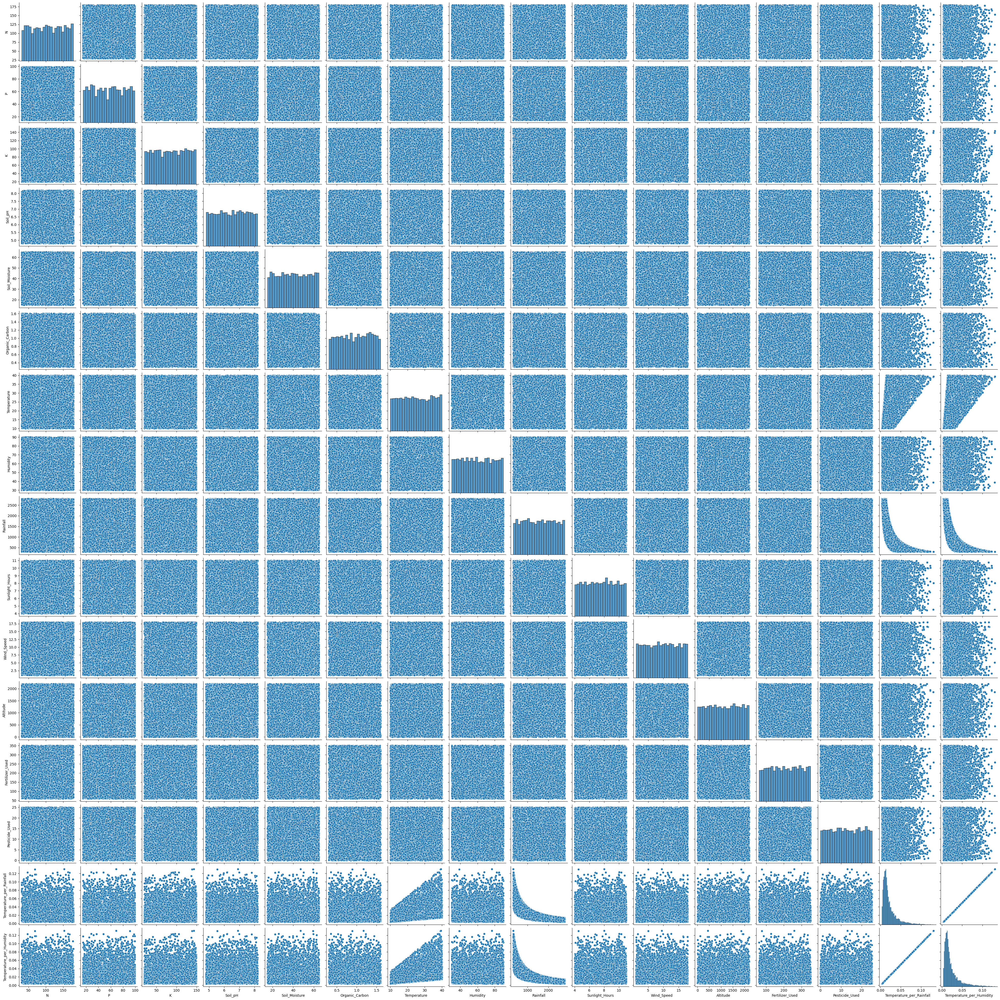

In [12]:
sns.pairplot(df)
plt.show()

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error,mean_squared_error, r2_score
df = pd.read_csv("crop-yield.csv")
df.head()

,N,P,K,Soil_pH,Soil_Moisture,Soil_Type,Organic_Carbon,Temperature,Humidity,Rainfall,Sunlight_Hours,Wind_Speed,Region,Altitude,Season,Crop_Type,Irrigation_Type,Fertilizer_Used,Pesticide_Used,Crop_Yield_ton_per_hectare
0,132,62,22,6.35,59.78,Clay,0.43,22.97,53.89,1305.68,7.73,15.96,Central,36,Rabi,Maize,Canal,223.48,23.36,11.42
1,122,71,66,5.98,25.54,Sandy,0.65,17.00,76.90,1942.05,9.25,12.60,North,1561,Rabi,Potato,Canal,161.54,4.42,23.19
2,44,35,104,8.07,25.87,Sandy,0.79,25.52,44.78,2216.20,8.50,15.63,North,1870,Rabi,Rice,Rainfed,184.62,6.29,7.94
3,136,96,113,4.83,42.97,Silt,0.45,18.59,31.89,607.18,8.75,5.49,East,765,Kharif,Sugarcane,Rainfed,274.02,2.72,72.53
4,101,34,42,5.84,48.01,Silt,0.69,22.74,46.27,483.47,8.00,7.44,Central,1143,Zaid,Wheat,Rainfed,72.69,15.37,6.72


In [22]:
df.drop("Soil_Type",axis=1, inplace=True)
df

,N,P,K,Soil_pH,Soil_Moisture,Organic_Carbon,Temperature,Humidity,Rainfall,Sunlight_Hours,Wind_Speed,Region,Altitude,Season,Crop_Type,Irrigation_Type,Fertilizer_Used,Pesticide_Used,Crop_Yield_ton_per_hectare
0,132,62,22,6.35,59.78,0.43,22.97,53.89,1305.68,7.73,15.96,Central,36,Rabi,Maize,Canal,223.48,23.36,11.42
1,122,71,66,5.98,25.54,0.65,17.00,76.90,1942.05,9.25,12.60,North,1561,Rabi,Potato,Canal,161.54,4.42,23.19
2,44,35,104,8.07,25.87,0.79,25.52,44.78,2216.20,8.50,15.63,North,1870,Rabi,Rice,Rainfed,184.62,6.29,7.94
3,136,96,113,4.83,42.97,0.45,18.59,31.89,607.18,8.75,5.49,East,765,Kharif,Sugarcane,Rainfed,274.02,2.72,72.53
4,101,34,42,5.84,48.01,0.69,22.74,46.27,483.47,8.00,7.44,Central,1143,Zaid,Wheat,Rainfed,72.69,15.37,6.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,80,21,64,7.22,34.04,0.85,35.20,78.31,850.20,10.26,2.20,East,1630,Rabi,Wheat,Rainfed,191.11,12.02,8.87
9996,168,36,36,6.45,56.84,0.66,37.19,38.78,2490.54,7.87,7.06,East,1665,Zaid,Sugarcane,Canal,238.87,21.86,77.29
9997,100,99,24,7.18,18.13,0.54,11.36,56.64,1965.34,10.06,12.42,Central,591,Zaid,Sugarcane,Drip,312.73,18.79,73.57
9998,68,20,63,6.32,53.47,0.68,35.95,57.94,497.37,10.18,6.28,North,1900,Kharif,Sugarcane,Rainfed,227.50,10.58,74.22


In [23]:
df.drop("Region",axis=1, inplace=True)
df

,N,P,K,Soil_pH,Soil_Moisture,Organic_Carbon,Temperature,Humidity,Rainfall,Sunlight_Hours,Wind_Speed,Altitude,Season,Crop_Type,Irrigation_Type,Fertilizer_Used,Pesticide_Used,Crop_Yield_ton_per_hectare
0,132,62,22,6.35,59.78,0.43,22.97,53.89,1305.68,7.73,15.96,36,Rabi,Maize,Canal,223.48,23.36,11.42
1,122,71,66,5.98,25.54,0.65,17.00,76.90,1942.05,9.25,12.60,1561,Rabi,Potato,Canal,161.54,4.42,23.19
2,44,35,104,8.07,25.87,0.79,25.52,44.78,2216.20,8.50,15.63,1870,Rabi,Rice,Rainfed,184.62,6.29,7.94
3,136,96,113,4.83,42.97,0.45,18.59,31.89,607.18,8.75,5.49,765,Kharif,Sugarcane,Rainfed,274.02,2.72,72.53
4,101,34,42,5.84,48.01,0.69,22.74,46.27,483.47,8.00,7.44,1143,Zaid,Wheat,Rainfed,72.69,15.37,6.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,80,21,64,7.22,34.04,0.85,35.20,78.31,850.20,10.26,2.20,1630,Rabi,Wheat,Rainfed,191.11,12.02,8.87
9996,168,36,36,6.45,56.84,0.66,37.19,38.78,2490.54,7.87,7.06,1665,Zaid,Sugarcane,Canal,238.87,21.86,77.29
9997,100,99,24,7.18,18.13,0.54,11.36,56.64,1965.34,10.06,12.42,591,Zaid,Sugarcane,Drip,312.73,18.79,73.57
9998,68,20,63,6.32,53.47,0.68,35.95,57.94,497.37,10.18,6.28,1900,Kharif,Sugarcane,Rainfed,227.50,10.58,74.22


In [24]:
df.drop("Season",axis=1, inplace=True)
df

,N,P,K,Soil_pH,Soil_Moisture,Organic_Carbon,Temperature,Humidity,Rainfall,Sunlight_Hours,Wind_Speed,Altitude,Crop_Type,Irrigation_Type,Fertilizer_Used,Pesticide_Used,Crop_Yield_ton_per_hectare
0,132,62,22,6.35,59.78,0.43,22.97,53.89,1305.68,7.73,15.96,36,Maize,Canal,223.48,23.36,11.42
1,122,71,66,5.98,25.54,0.65,17.00,76.90,1942.05,9.25,12.60,1561,Potato,Canal,161.54,4.42,23.19
2,44,35,104,8.07,25.87,0.79,25.52,44.78,2216.20,8.50,15.63,1870,Rice,Rainfed,184.62,6.29,7.94
3,136,96,113,4.83,42.97,0.45,18.59,31.89,607.18,8.75,5.49,765,Sugarcane,Rainfed,274.02,2.72,72.53
4,101,34,42,5.84,48.01,0.69,22.74,46.27,483.47,8.00,7.44,1143,Wheat,Rainfed,72.69,15.37,6.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,80,21,64,7.22,34.04,0.85,35.20,78.31,850.20,10.26,2.20,1630,Wheat,Rainfed,191.11,12.02,8.87
9996,168,36,36,6.45,56.84,0.66,37.19,38.78,2490.54,7.87,7.06,1665,Sugarcane,Canal,238.87,21.86,77.29
9997,100,99,24,7.18,18.13,0.54,11.36,56.64,1965.34,10.06,12.42,591,Sugarcane,Drip,312.73,18.79,73.57
9998,68,20,63,6.32,53.47,0.68,35.95,57.94,497.37,10.18,6.28,1900,Sugarcane,Rainfed,227.50,10.58,74.22


In [25]:
df.drop("Crop_Type",axis=1, inplace=True)
df

,N,P,K,Soil_pH,Soil_Moisture,Organic_Carbon,Temperature,Humidity,Rainfall,Sunlight_Hours,Wind_Speed,Altitude,Irrigation_Type,Fertilizer_Used,Pesticide_Used,Crop_Yield_ton_per_hectare
0,132,62,22,6.35,59.78,0.43,22.97,53.89,1305.68,7.73,15.96,36,Canal,223.48,23.36,11.42
1,122,71,66,5.98,25.54,0.65,17.00,76.90,1942.05,9.25,12.60,1561,Canal,161.54,4.42,23.19
2,44,35,104,8.07,25.87,0.79,25.52,44.78,2216.20,8.50,15.63,1870,Rainfed,184.62,6.29,7.94
3,136,96,113,4.83,42.97,0.45,18.59,31.89,607.18,8.75,5.49,765,Rainfed,274.02,2.72,72.53
4,101,34,42,5.84,48.01,0.69,22.74,46.27,483.47,8.00,7.44,1143,Rainfed,72.69,15.37,6.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,80,21,64,7.22,34.04,0.85,35.20,78.31,850.20,10.26,2.20,1630,Rainfed,191.11,12.02,8.87
9996,168,36,36,6.45,56.84,0.66,37.19,38.78,2490.54,7.87,7.06,1665,Canal,238.87,21.86,77.29
9997,100,99,24,7.18,18.13,0.54,11.36,56.64,1965.34,10.06,12.42,591,Drip,312.73,18.79,73.57
9998,68,20,63,6.32,53.47,0.68,35.95,57.94,497.37,10.18,6.28,1900,Rainfed,227.50,10.58,74.22


In [26]:
df.drop("Irrigation_Type",axis=1, inplace=True)
df

,N,P,K,Soil_pH,Soil_Moisture,Organic_Carbon,Temperature,Humidity,Rainfall,Sunlight_Hours,Wind_Speed,Altitude,Fertilizer_Used,Pesticide_Used,Crop_Yield_ton_per_hectare
0,132,62,22,6.35,59.78,0.43,22.97,53.89,1305.68,7.73,15.96,36,223.48,23.36,11.42
1,122,71,66,5.98,25.54,0.65,17.00,76.90,1942.05,9.25,12.60,1561,161.54,4.42,23.19
2,44,35,104,8.07,25.87,0.79,25.52,44.78,2216.20,8.50,15.63,1870,184.62,6.29,7.94
3,136,96,113,4.83,42.97,0.45,18.59,31.89,607.18,8.75,5.49,765,274.02,2.72,72.53
4,101,34,42,5.84,48.01,0.69,22.74,46.27,483.47,8.00,7.44,1143,72.69,15.37,6.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,80,21,64,7.22,34.04,0.85,35.20,78.31,850.20,10.26,2.20,1630,191.11,12.02,8.87
9996,168,36,36,6.45,56.84,0.66,37.19,38.78,2490.54,7.87,7.06,1665,238.87,21.86,77.29
9997,100,99,24,7.18,18.13,0.54,11.36,56.64,1965.34,10.06,12.42,591,312.73,18.79,73.57
9998,68,20,63,6.32,53.47,0.68,35.95,57.94,497.37,10.18,6.28,1900,227.50,10.58,74.22


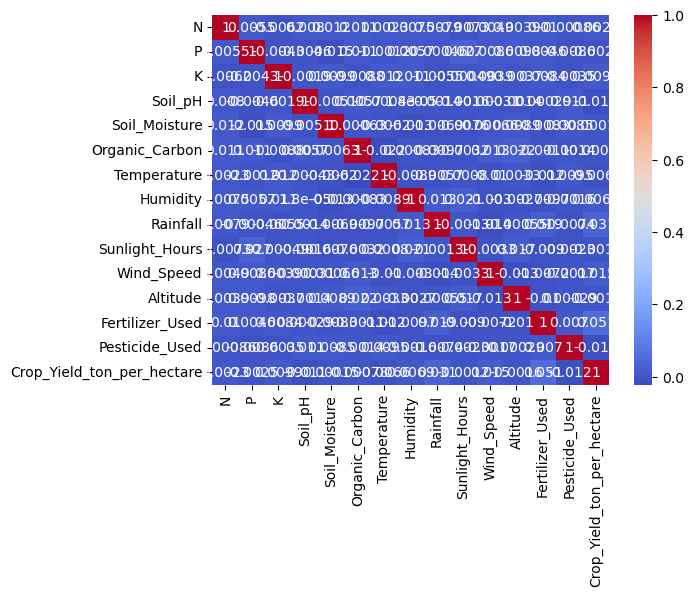

In [27]:
sns.heatmap(df.corr(), annot=True, cmap="coolwarm")
plt.show()

In [28]:
X = df[["Humidity", "Temperature", "Rainfall", "Altitude"]] 
y = df["Crop_Yield_ton_per_hectare"]

In [29]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

In [30]:
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [32]:
coef_df = pd.DataFrame({
    "Feature": X.columns,
    "Coefficient": model.coef_
})
print("Intercept:",model.intercept_)

Intercept: 21.066051489510695


In [33]:
coef_df

,Feature,Coefficient
0,Humidity,0.009600
1,Temperature,-0.029332
2,Rainfall,0.001069
3,Altitude,-0.000209


In [34]:
y_pred = model.predict(X_test)

In [36]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
print("MSE :", mse)
print("RMSE:", rmse)
print("R^2 Score:", r2)

MSE : 582.7752679646321
RMSE: 24.140738761782583
R^2 Score: 0.00017558995136512934


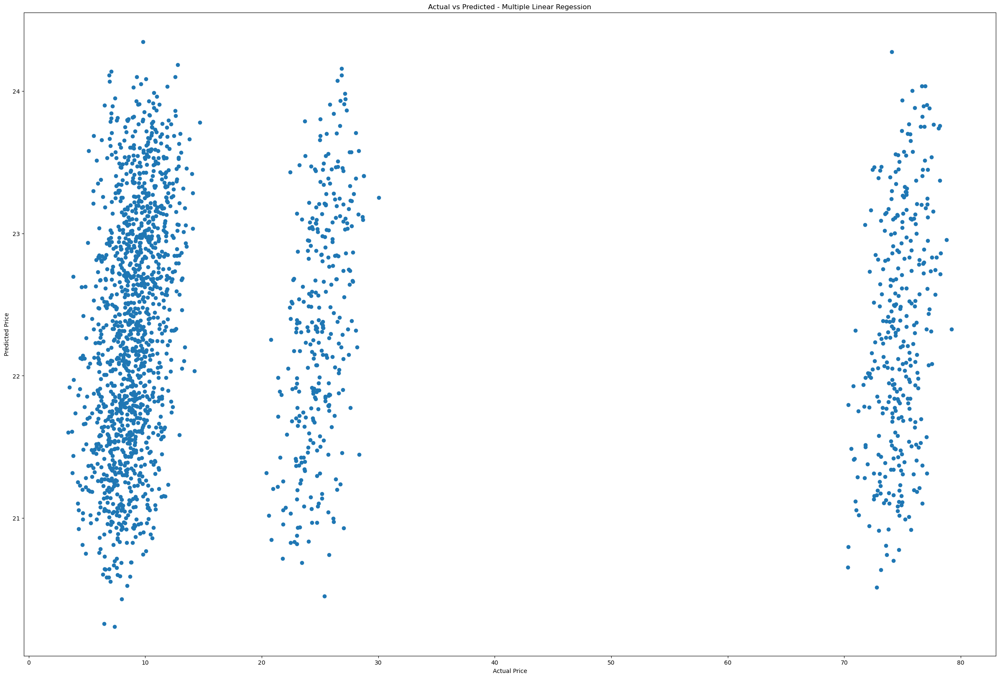

In [39]:
plt.figure(figsize=(30,20))
plt.scatter(y_test, y_pred)
plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")
plt.title("Actual vs Predicted - Multiple Linear Regession")
plt.show()